In [1]:
%%time
%matplotlib inline
import tag

/home/but/.local/lib/python3.5/site-packages/gensim/utils.py:491: DeprecationWarning:

Call to deprecated `cum_table` (Attribute will be removed in 4.0.0, use self.vocabulary.cum_table instead).



CPU times: user 6.41 s, sys: 953 ms, total: 7.36 s
Wall time: 7.13 s


Создаём объект TagComment, в конструкторе указываем файл с комментариями  
должны обязательно быть два столбца **title** и **content**, т.е. в первой строчке названия столбцов **title** и **content**  
если ваш файл формата excel, укажите в конструкторе `csv=False`

In [2]:
tagComment = tag.TagComment('labirint.csv')

### Преобразование данных может занять какое-то время  
    точнее, оно займёт время... 1000 комментариев может обрабатываться до 10-12 секунд

In [3]:
%%time
df_tag, df_attrharr = tagComment.fit()

lemmatisation end
tokenize end
stop delete end: : 0 sec
spellcheker end
bi-tri gramm end
CPU times: user 4.35 s, sys: 4.45 s, total: 8.8 s
Wall time: 8.03 s


/home/but/AppFollow/api/tag.py:329: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



# Пирог
>*если Вы хотите есть, пропустите этот этап*  

>`pipe(self, percent = 0.02, tag = None, tagOrattr = True)`  
>percent - тег занимающий столько же и меньше, от общего объёма тегов, не будет выведен   
>tag - учитываются только те комментарии, в которых присутствут данный тег  
>tagOrattr - True-выводятся теги, False-выводятся укркпнённые теги

# Было

In [4]:
tagComment.pipe()

# Стало

In [4]:
tagComment.pipe()

# Было

In [5]:
tagComment.pipe(tag = 'дизайн')

# Стало

In [4]:
tagComment.pipe(tag = 'UI/UX Design')

# Укрупнённые теги   
    а - атрибут  
    х - характеристика нейтрал  
    х/п - характеристика позитив  
    х/н - характеристика негатив  
    х/п/к - характеристика позитив конеретика (красиво, спасибо, удобно и т.д.)  
    х/н/к - характеристика негатив конеретика (конкретный баг: не работает, тормозит. Высокие цены и т.д.)  
    з - вское гавно типа (спам, казино, промокод)

# Было

In [5]:
tagComment.pipe(tagOrattr=False)

# Стало

In [4]:
tagComment.pipe(tagOrattr=False)

# Комментарии на плоскости  
> для каждго слова у нас есть расчитаный 300-т мерный вектор, так скажем, в семантическом пространстве слов  
> в теории, если взять комментарий из нескольких слов, получить его средний вектор, и изобразить на плоскости, то комментарии, похожие по смыслу, будут находиться рядом.  
> вот три примера с разными алгоритмами понижения размерности

(*мне кажется, PCA отработал лучше остальных, к тому же, и справился за 0,187 секунды*)

In [7]:
%%time
tagComment.scatter()

CPU times: user 469 ms, sys: 358 ms, total: 827 ms
Wall time: 34.5 s


# Было

In [8]:
%%time
tagComment.scatter(manifolds= 'PCA')

CPU times: user 247 ms, sys: 202 ms, total: 449 ms
Wall time: 187 ms


# Стало

In [4]:
%%time
tagComment.scatter(manifolds= 'PCA')

CPU times: user 303 ms, sys: 256 ms, total: 559 ms
Wall time: 303 ms


# Было

In [9]:
%%time
tagComment.scatter(manifolds= 'Iso')

CPU times: user 1.48 s, sys: 258 ms, total: 1.73 s
Wall time: 1.16 s


# Стало

In [11]:
%%time
tagComment.scatter(manifolds= 'Iso')

CPU times: user 1.58 s, sys: 312 ms, total: 1.9 s
Wall time: 1.09 s


# Теги
`tag_comment(start = 0, end = None)`
вывести комментарии с назначенными тегами

# Вывод по важности

In [4]:
%%time
tagComment.tag_comment(sortInfo=True)

Раньше всё было прекрасно, пока не поменялся дизайн. Черный цвет слишком 
мрачный, из-за него не хочется лишний раз заходить в приложение, видимо 
придется его вообще удалить. И уж точно он совершенно не подходит для 
магазина книг. Сделайте хотя бы возможность выбора цвета оформления для 
пользователей, я бы с удовольствием вернулась к привычному красному цвету. 
И второе: раньше на странице книги сразу под фотографией обложки 
отображалась информация с оценкой, количеством рецензий и фото. Теперь надо 
листать вниз, чтобы увидеть всю эту информацию. Это очень неудобно! Вы либо 
фото обложки поменьше сделайте, либо поднимите строчку с этими данными 
повыше.
Bugs                 3
Feature Requests     5
UI/UX Design         6
Positive             2
Problems             1
Negative             2
Delete this          1
App Version          3
Not Convenient       1
Photo                3
Info                27
Name: 568, dtype: int64
cl_id
х/н       6
а        11
х         6
х/п       1
х/

Name: 601, dtype: int8
---------------------------------------------------------------------
Прекрасный интерфейс, удобный поиск, разделы по категориям, частые скидки и акции, что ещё нужно человеку, который обожает книги? Прекрасные цены! Лабиринт, спасибо что ты есть!
Feature Requests     1
UI/UX Design         1
Positive             6
Money & Pricing      1
Thank you            1
Convenient           1
Info                11
Name: 280, dtype: int64
cl_id
а        2
х        1
х/п      4
х/п/к    2
Name: 280, dtype: int8
---------------------------------------------------------------------
Эй вы! Красный цвет верните. Я когда искала приложение знала что оно 
красное, и не могла найти. Оказалось вы сменили дизайн. Верните пж красный
Feature Requests     2
UI/UX Design         4
Problems             1
Negative             2
App Version          2
Info                11
Name: 455, dtype: int64
cl_id
х/н    1
а      6
х      4
Name: 455, dtype: int8
--------------------------------------

Name: 28, dtype: int8
---------------------------------------------------------------------
Отличный книжный интернет-магазин ВО ВРЕМЯ СКИДОК! В обычное время цены выше, чем в аналогичных магазинах. К качеству книг претензий нет, сколько ни заказывала, книг с дефектами не было. Кстати, чёрный фон вам не идёт. Красный был лучше! Придумайте что-нибудь поярче, если хотите изменений. Ускорьте пожалуйста время добавления товара в корзину, очень долго идёт этот процесс. А так, приложение в пользовании удобное. Рекомендую.
Feature Requests     4
UI/UX Design         3
Positive             6
Money & Pricing      1
Problems             1
Negative             3
Convenient           1
App Freeze           1
Info                20
Name: 29, dtype: int64
cl_id
х/н      1
а        2
х        6
х/п      4
х/н/к    3
х/п/к    2
Name: 29, dtype: int8
---------------------------------------------------------------------
Очень удобное ! Все работает отлично !
Positive      2
Convenient    1
Info         

In [10]:
%%time
tagComment.tag_comment()

Пишет нет подключения к интернет и соответственно не работает. Естественно интернет при этом есть, и все другие программы в норме
баг            2
позитив        1
обновление     1
интернет       3
не работает    2
Name: 0, dtype: int64
cl_id
а        4
х/п      1
х/н/к    2
Name: 0, dtype: int64
---------------------------------------------------------------------
Очень удобно
удобно    1
Name: 1, dtype: int64
cl_id
х/п/к    1
Name: 1, dtype: int64
---------------------------------------------------------------------
Лучшее приложение 👍🏻
позитив    2
удобно     1
Name: 2, dtype: int64
cl_id
х/п      2
х/п/к    1
Name: 2, dtype: int64
---------------------------------------------------------------------
Замечательно приложение. Удобно пользоваться. Работает Apple Pay, что не может не радовать)))
позитив     2
проблема    1
удобно      1
Name: 3, dtype: int64
cl_id
х/н      1
х/п      2
х/п/к    1
Name: 3, dtype: int64
--------------------------------------------------------------------

Name: 39, dtype: int64
---------------------------------------------------------------------
Лучшее приложение
позитив    1
Name: 40, dtype: int64
cl_id
х/п    1
Name: 40, dtype: int64
---------------------------------------------------------------------
Обновила приложение и пришла в ужас. Как будто на похоронах! Черный цвет в дизайне вместо привычного красного. Вы серьезно? Сделайте откат, даже заходить теперь не хочется. Кто вообще до этого додумался! Это не стильно выглядит, а жутко и безвкусно! С уважением, Ваш преданный пользователь и многолетний заказчик
вопрос        1
дизайн        5
позитив       1
обращение     1
негатив       4
удаляю        1
обновление    1
отправлять    1
Name: 41, dtype: int64
cl_id
х/н      5
а        6
х        2
х/п/к    1
Name: 41, dtype: int64
---------------------------------------------------------------------
Все очень удобно, удобная навигация. Легко модно найти любую книгу. Спасибо разработчикам!!
позитив      3
обращение    1
удобно       3
N

Name: 80, dtype: int64
---------------------------------------------------------------------
Ужасный чёрный цвет приложения (((((
дизайн       2
обращение    1
негатив      1
Name: 81, dtype: int64
cl_id
х/н    1
а      2
х      1
Name: 81, dtype: int64
---------------------------------------------------------------------
Одно из самых стабильных, удобных и красивых приложений! А рулетка в акциях вообще класс! Разработчикам респект ❤️
дизайн       1
позитив      5
обращение    1
удобно       1
Name: 82, dtype: int64
cl_id
х/п      2
х/п/к    3
Name: 82, dtype: int64
---------------------------------------------------------------------
CPU times: user 376 ms, sys: 29.6 ms, total: 406 ms
Wall time: 434 ms


In [11]:
%%time
tagComment.tag_comment(start=5, end=7)

Хорошое приложение!
позитив    1
Name: 5, dtype: int64
cl_id
х/п    1
Name: 5, dtype: int64
---------------------------------------------------------------------
Отличный интернет магазин
позитив     1
интернет    1
Name: 6, dtype: int64
cl_id
а      1
х/п    1
Name: 6, dtype: int64
---------------------------------------------------------------------
CPU times: user 8.4 ms, sys: 124 µs, total: 8.52 ms
Wall time: 8.18 ms


# Облака

> облако слов может оказаться крутой и полезной штукой, чтобы быстро понять, что происходит (*все одзывы в одной картинке*)  
> `wcloud( style = 'cloud', tag = None, weight = 0, tfidf = False, q = False, key = False, keyw = 1.7)`  
> - style - стиль облака  
> - tag - учитываются только те комментарии, в которых присутствут данный тег  
> - weight - больше какого значение должен быть коэффициент тега в комментарии (*при tag = None игнорируется*)
> - tfidf - если True -- вес некоторого слова пропорционален количеству употребления этого слова в документе, и обратно пропорционален частоте употребления слова во всех документах коллекции. Проще оворя, если слово есть во многих комментариях - вес будет меньше, если слово часто встречается в одном комментарии - вес будет больше (*так себе идея, но попробовать стоило*)  
> - q - если True -- квантили по 0,05 обрезаются, для более выразительного облака (*- 5% самых частых слов и самых редких слов*)  
> - key - если True -- вес ключевых слов домножается на keyw

### Цвета слов
    зелёный - х/п, х/п/к (позитив)  
    красный - х/н, х/н/к (негатив)  
    желтый - а (атрибут)  
    синий - общие

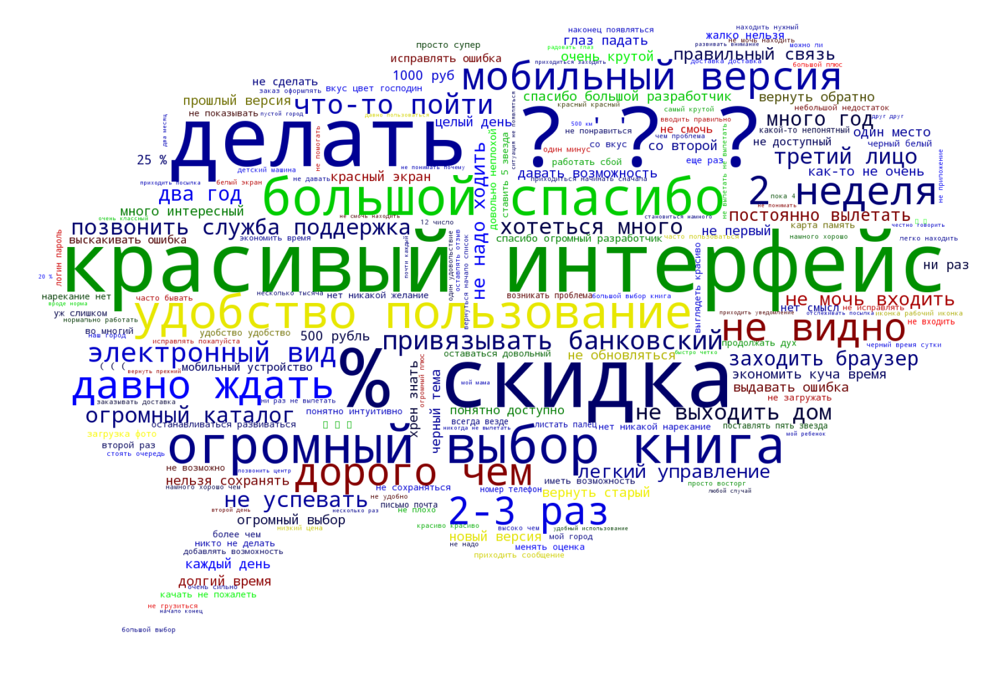

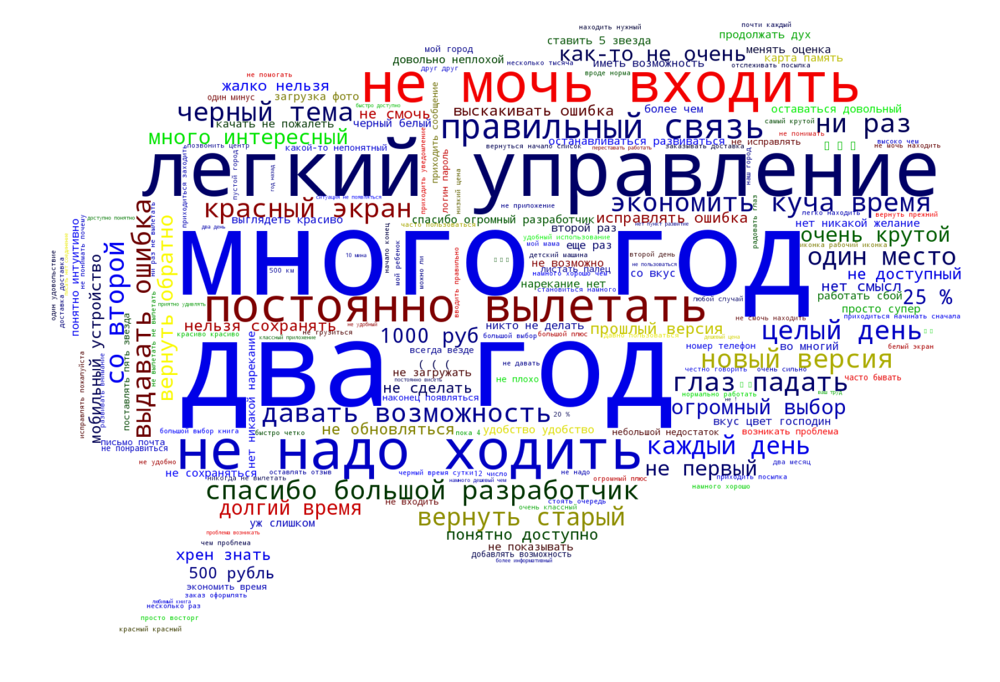

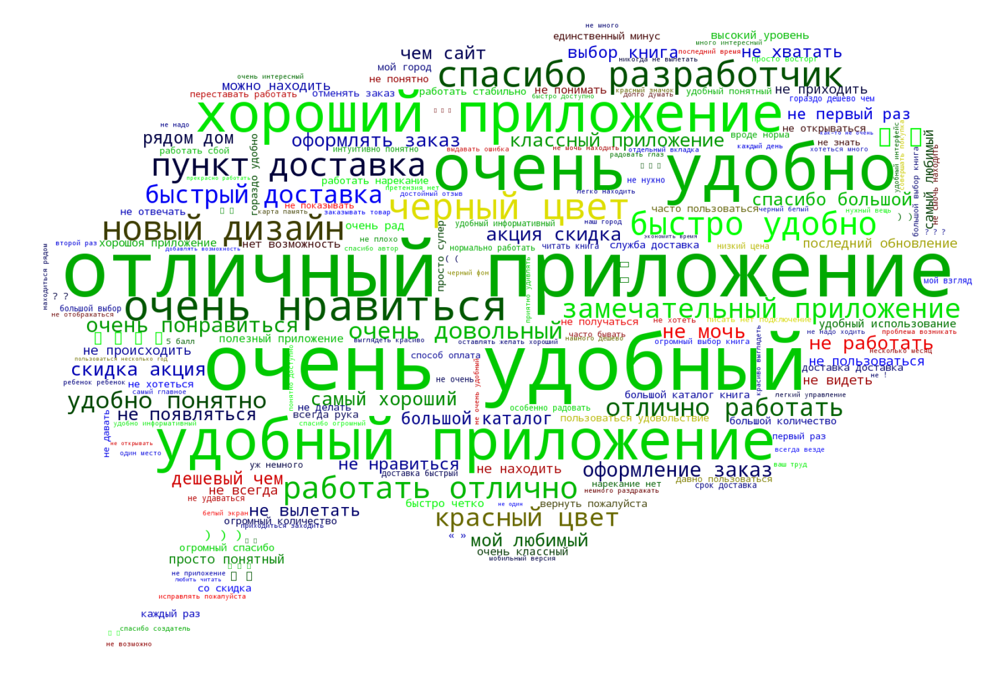

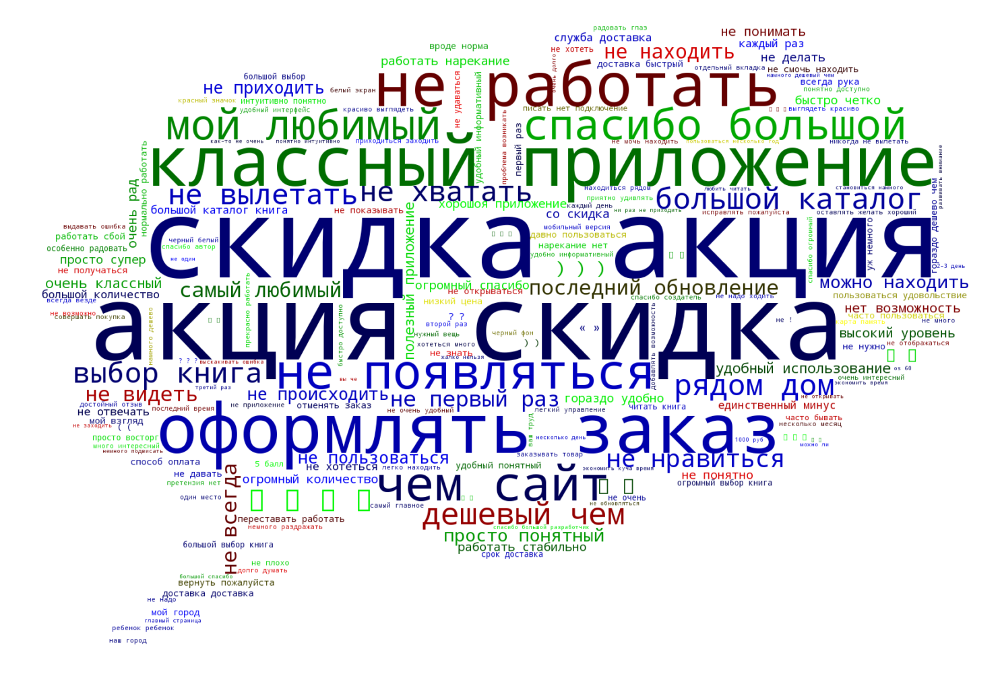

CPU times: user 33.4 s, sys: 1.09 s, total: 34.5 s
Wall time: 33.5 s


In [12]:
%%time
tagComment.wcloud()
tagComment.wcloud(q = True)
tagComment.wcloud(tfidf = True)
tagComment.wcloud(tfidf = True,q = True)

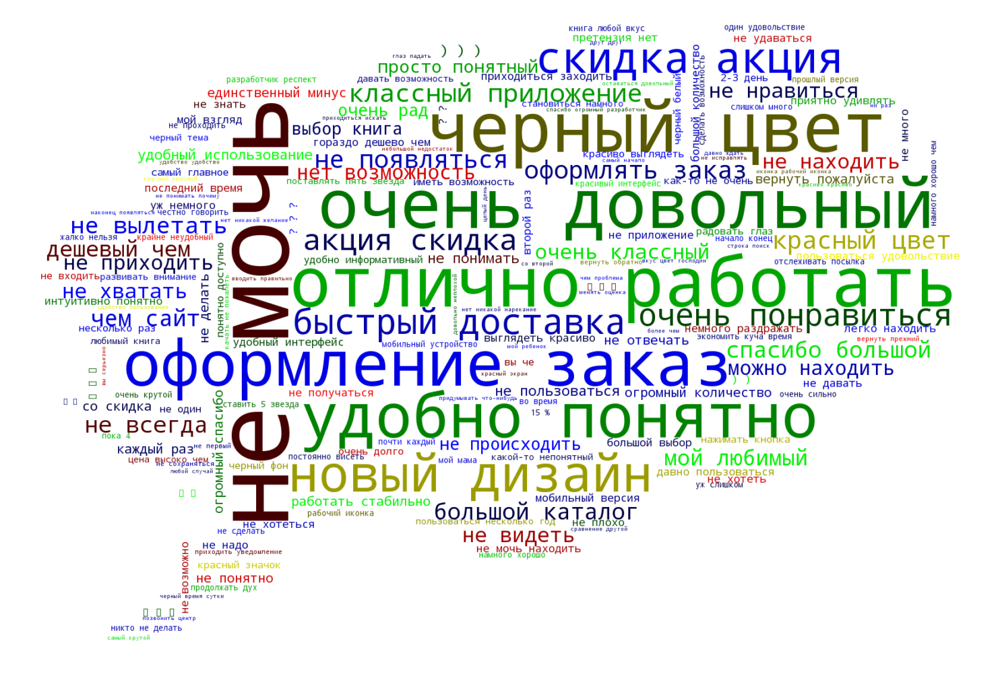

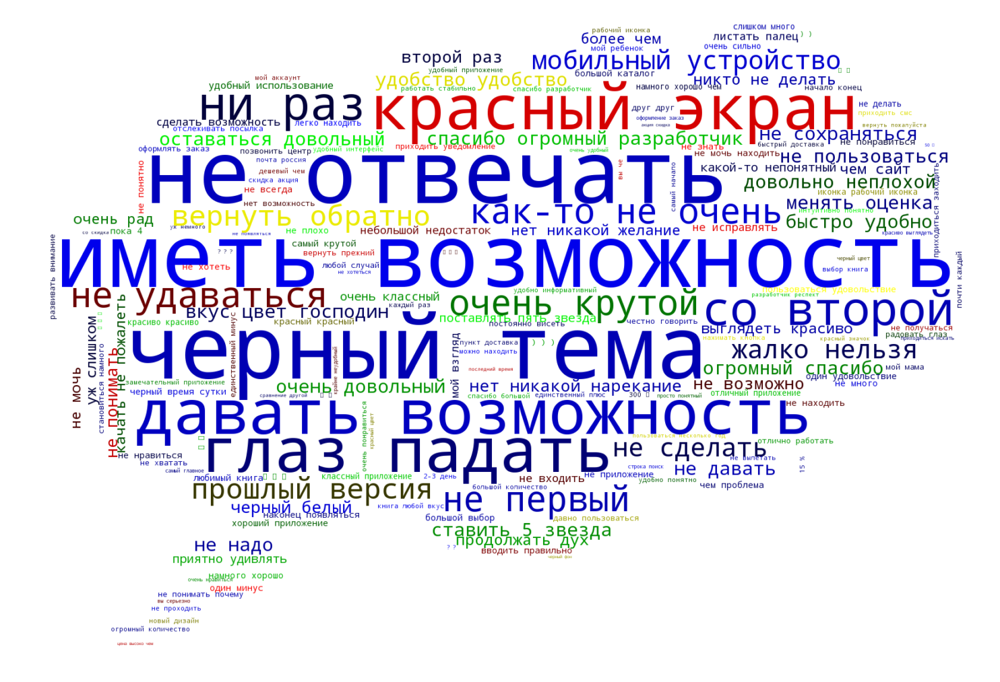

CPU times: user 16.3 s, sys: 478 ms, total: 16.8 s
Wall time: 16.3 s


In [13]:
%%time
tagComment.wcloud(tag = 'дизайн', tfidf = True, q = True)
tagComment.wcloud(tag = 'дизайн', q = True)

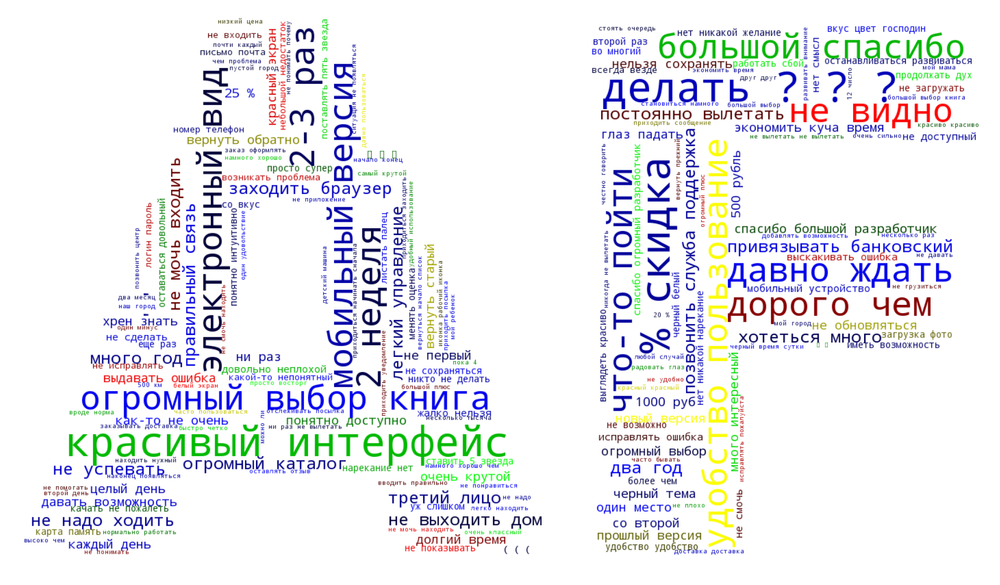

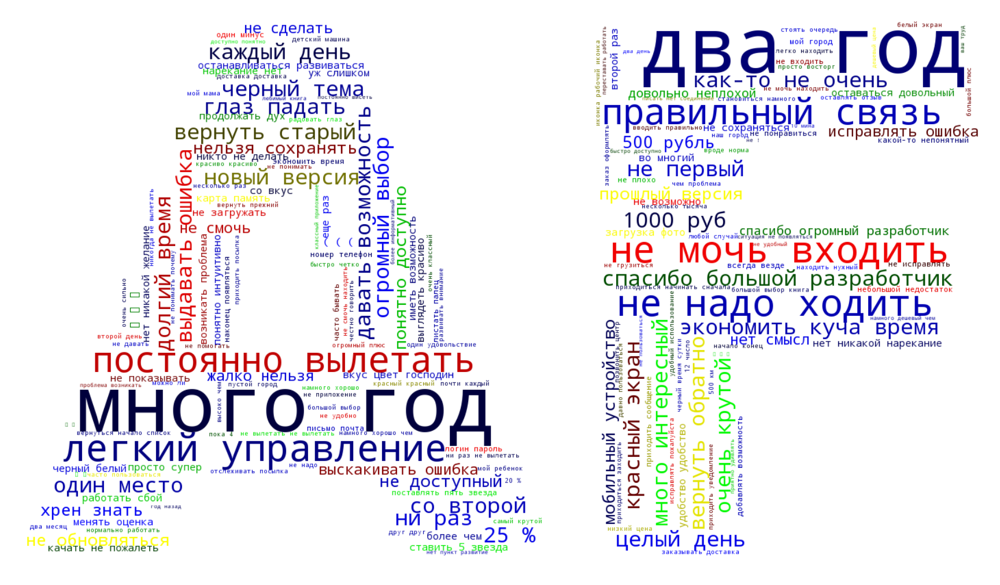

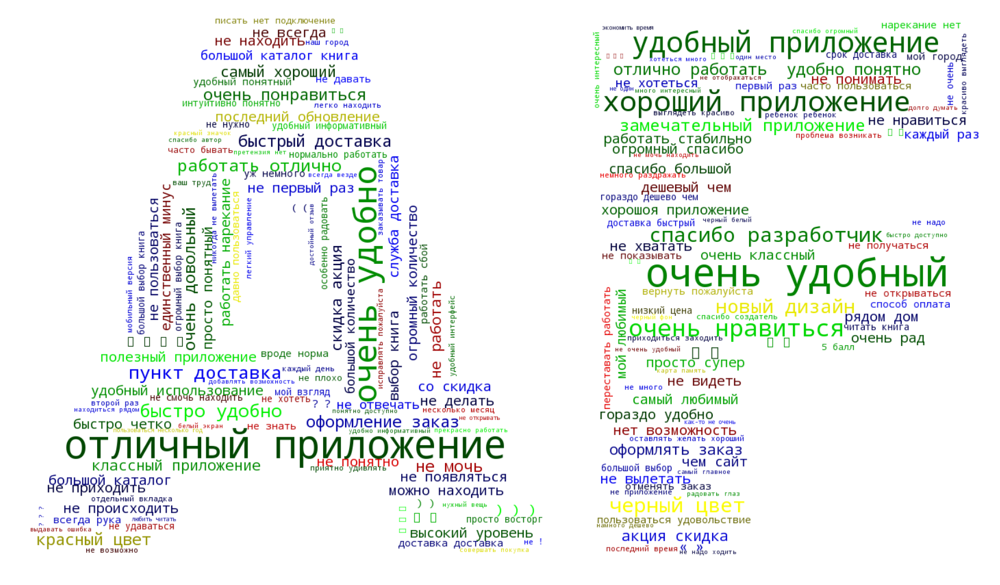

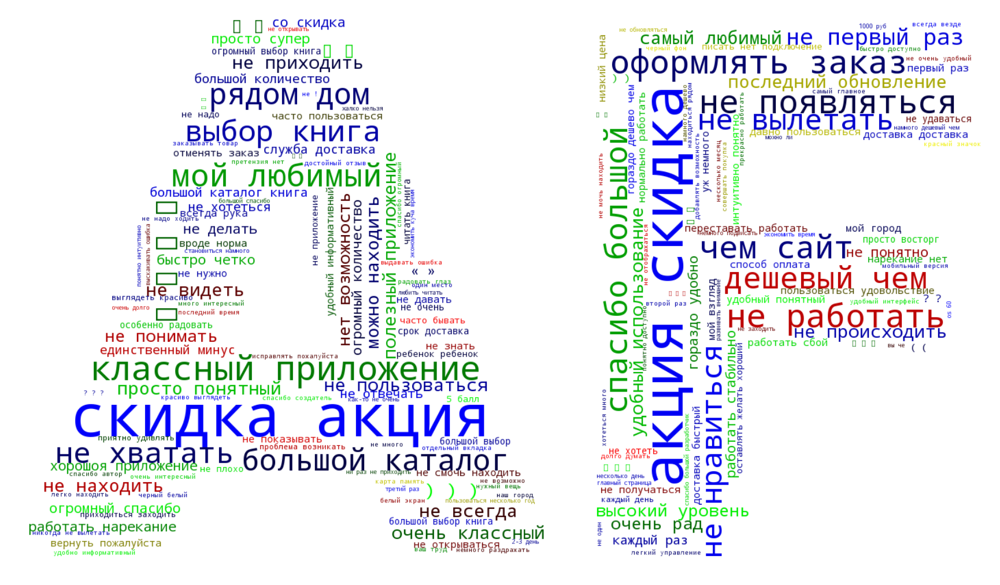

CPU times: user 22.2 s, sys: 1.07 s, total: 23.3 s
Wall time: 22.2 s


In [14]:
%%time
tagComment.wcloud( style = 'AF')
tagComment.wcloud( style = 'AF',q = True)
tagComment.wcloud( style = 'AF',tfidf = True)
tagComment.wcloud( style = 'AF',tfidf = True,q = True)

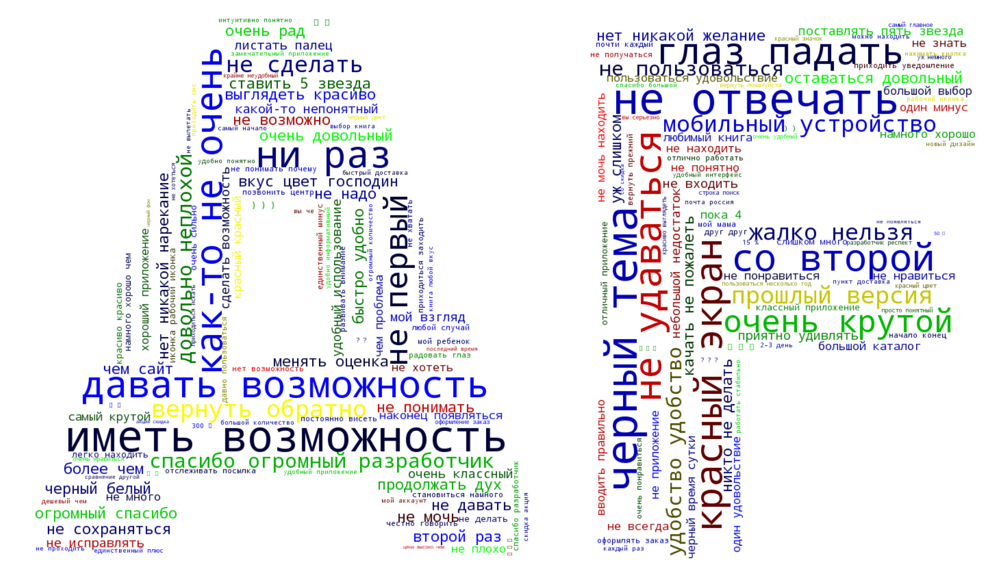

CPU times: user 5.44 s, sys: 276 ms, total: 5.71 s
Wall time: 5.44 s


In [15]:
%%time
tagComment.wcloud(tag = 'дизайн', style = 'AF', q = True)

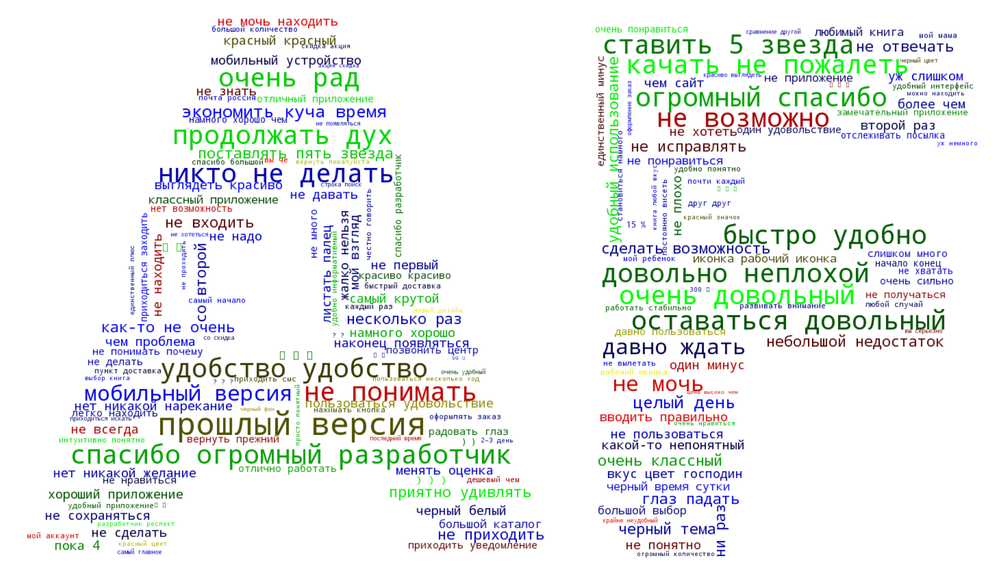

CPU times: user 5.31 s, sys: 281 ms, total: 5.59 s
Wall time: 5.32 s


In [5]:
%%time
tagComment.wcloud(tag = 'дизайн', style = 'AF', q = True, key=True, keyw = 1.2)

по мне, лучший вариант :  
`wcloud(q = True)`